
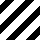
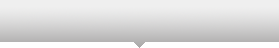
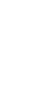
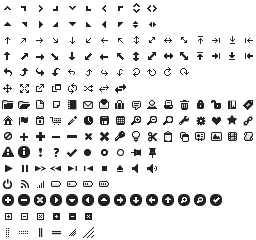
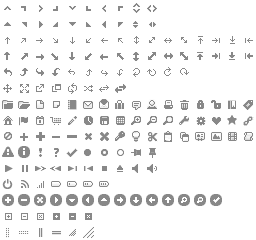
...
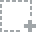
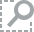
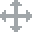
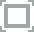
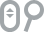

In [1]:
#Python 2.7 notebook to extract country shapes from file and convert to map-like plot in Bokeh
from __future__ import print_function,division
import numpy as np
import pandas as pd
import requests
import os
from bokeh.plotting import *
from bokeh.models import HoverTool, ColumnDataSource
from collections import OrderedDict
import osgeo.ogr
output_notebook()   

In [2]:
# This will download the data you need automatically and place them in the local folder
if not os.path.exists('TM_WORLD_BORDERS-0'):
    os.makedirs('TM_WORLD_BORDERS-0')

url = "http://www.files.benlaken.com/documents/TM_WORLD_BORDERS-0/"
fnms = ["TM_WORLD_BORDERS-0.3.dbf",
        "TM_WORLD_BORDERS-0.3.prj",
        "TM_WORLD_BORDERS-0.3.shp",
        "TM_WORLD_BORDERS-0.3.shx"]

for fn in fnms:
    r = requests.get(url+fn)
    with open('TM_WORLD_BORDERS-0/'+fn, 'wb') as f:
        f.write(r.content)

In [3]:
# Link to the data with the OSGEO library
country_file = 'TM_WORLD_BORDERS-0/TM_WORLD_BORDERS-0.3.shp'
ShapeData = osgeo.ogr.Open(country_file)                
TheLayer = ShapeData.GetLayer(iLayer=0)

In [4]:
Find_Countries=['Norway','Finland','Sweden'] # Turn this on/off to grab specific countries

bk_xpoints=[]
bk_ypoints=[]
Ctry_list=[]

ShapeData = osgeo.ogr.Open(country_file)                  # Make a link to TM world borders
TheLayer = ShapeData.GetLayer(iLayer=0)

for n in range(246):
    tmp_feature = TheLayer.GetFeature(n).ExportToJson(as_object=True)
    #if tmp_feature['properties']['NAME'] in Find_Countries:  # Turn this on to get specific
    if True:                                                  # countries only...
        #print('Found shape of',tmp_feature['properties']['NAME'])
        
        
        xpoints =[]                                                             # Tmp hold
        ypoints =[]
        if(len(tmp_feature['geometry']['coordinates']) == 1):  # if only one polygon in country
            xpoints=[]
            ypoints=[]
            for points in tmp_feature['geometry']['coordinates'][0]:
                #print(points[0],points[1])
                xpoints.append(points[0])
                ypoints.append(points[1])
            bk_xpoints.append(xpoints)
            bk_ypoints.append(ypoints)
            Ctry_list.append([tmp_feature['properties']['NAME']])
                  
        if(len(tmp_feature['geometry']['coordinates']) > 2): # If country has multi-polygons
            for n in range(len(tmp_feature['geometry']['coordinates'])):
                xpoints=[]
                ypoints=[]
                for points in tmp_feature['geometry']['coordinates'][n][0]:
                    #print(points[0],points[1])
                    xpoints.append(points[0])
                    ypoints.append(points[1])
                bk_xpoints.append(xpoints)
                bk_ypoints.append(ypoints)
                Ctry_list.append([tmp_feature['properties']['NAME']])

Now roughly, the bk_x and y points contain lists of lists, where each list group are
the xy points for the countries in Ctry_list, note that there may be multiple lists
per country, as countries can have multiple polygons. You will have to grab all the
relevant polygons for a country to plot just one.

In [6]:
source = ColumnDataSource(     # Construct a data dictionary for Bokeh to use
    data=dict(
        xlist=bk_xpoints,
        ylist=bk_ypoints,
        Ctry=Ctry_list,
    )
)


p = figure(title="Country test")

p.patches("xlist", "ylist", fill_color='green',fill_alpha=0.7,
    line_color="black", line_width=0.5,source=source)

p.yaxis.axis_label="Latitude (°N)"
p.xaxis.axis_label="Longitude (°E)"
p.background_fill= "#19D1FF"

show(p)